In [ ]:

!pip install tensorflow
import tensorflow
import numpy as np
from numpy import zeros
from numpy import ones
from numpy.random import randint
from keras.optimizers import Adam
from keras.initializers import RandomNormal
from keras.models import Model
from keras.layers import Input
from keras.layers import Conv2D
from keras.layers import MaxPool2D
from keras.layers import Flatten
from keras.layers import Dense
from keras.layers import Conv2DTranspose
from keras.layers import LeakyReLU
from keras.layers import Activation
from keras.layers import Concatenate
from keras.layers import Dropout
from keras.layers import BatchNormalization
from matplotlib import pyplot as plt
from tensorflow.keras.utils import plot_model

In [ ]:
! pip install -q kaggle
from google.colab import files
files.upload()
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json

mkdir: cannot create directory ‘/root/.kaggle’: File exists


In [ ]:
! kaggle datasets download -d abdallahwagih/retina-blood-vessel

retina-blood-vessel.zip: Skipping, found more recently modified local copy (use --force to force download)


In [ ]:
! unzip retina-blood-vessel.zip

Archive:  retina-blood-vessel.zip
replace Data/test/image/0.png? [y]es, [n]o, [A]ll, [N]one, [r]ename: N


In [ ]:
import os
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

In [ ]:
def load_images_from_folder (folder_path) :
  images = []
  images_path = []
  for img in os.listdir (folder_path ) :
    if img.endswith((".png")) :
      img_path = os.path.join(folder_path, img)
      img_array = cv2.imread(img_path)

      img_array = cv2.cvtColor(img_array, cv2.COLOR_BGR2RGB)

      images.append(img_array)
      images_path.append(img_path)
  images= np.array(images)
  return images, images_path

In [ ]:
train_images_path = "/content/Data/train/image"
train_mask_path  = "/content/Data/train/mask"

test_images_path = "/content/Data/test/image"
test_mask_path  = "/content/Data/test/mask"

In [ ]:
train_images , train_images_path_array = load_images_from_folder(train_images_path)
train_masks , train_masks_path_array = load_images_from_folder(train_mask_path)

test_images , test_images_path_array = load_images_from_folder(test_images_path)
test_masks , test_masks_path_array = load_images_from_folder(test_mask_path)

In [ ]:
def plot_couples ( images , masks, nbr_samples = 10  ) :
  counter = 0
  for image , mask in zip(images , masks) :
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))  # 1 row, 2 columns

    # Display the first image in the first subplot
    ax1.imshow(image)
    ax1.set_title('Retinal fundus image ' + str(counter + 1))
    ax1.axis('off')

    # Display the second image in the second subplot
    ax2.imshow(mask)
    ax2.set_title('Blood vessel segmentation'+ str(counter + 1))
    ax2.axis('off')

    counter += 1
    if counter == nbr_samples :
      break

In [ ]:
def preprocess (images) :
  return images/255

In [ ]:
train_images = preprocess(train_images)
train_masks = preprocess(train_masks)

test_images = preprocess(test_images)
test_masks = preprocess(test_masks)

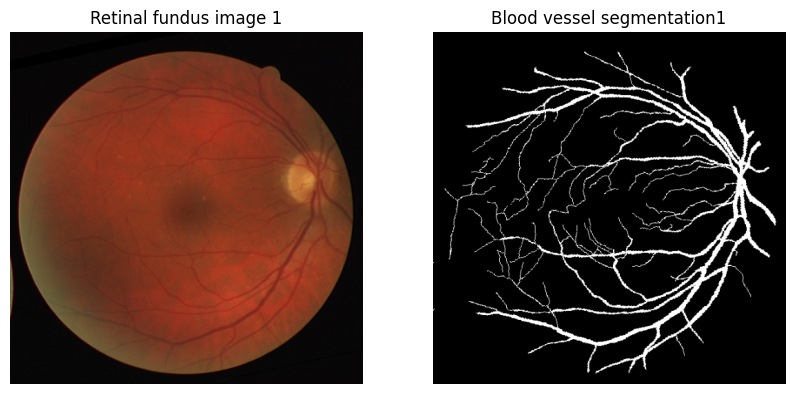

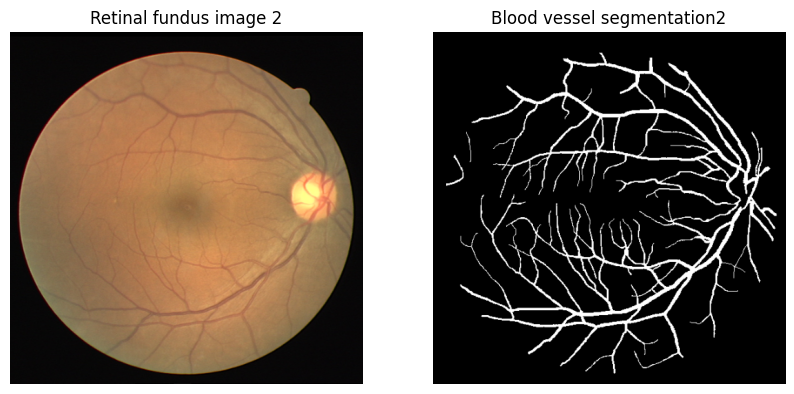

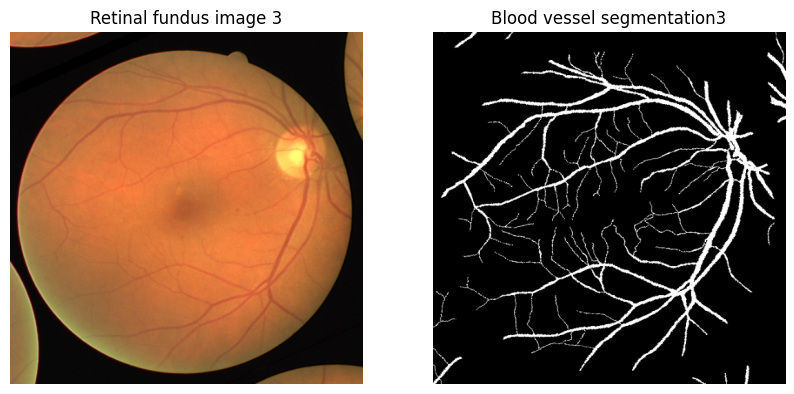

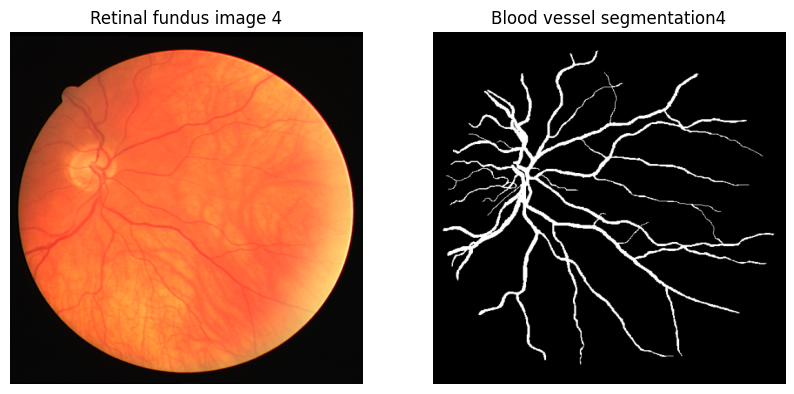

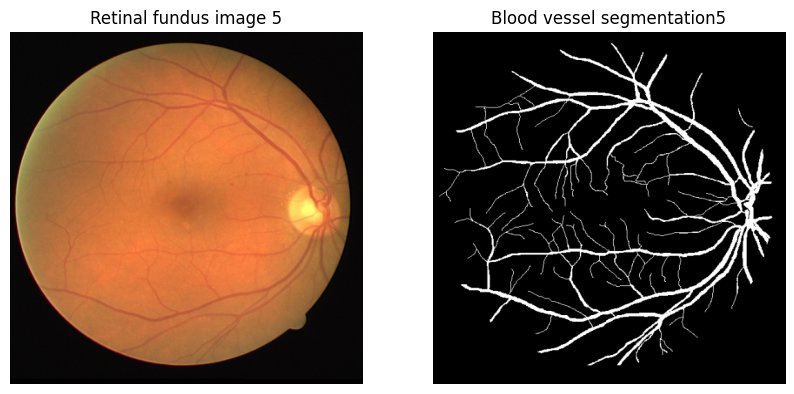

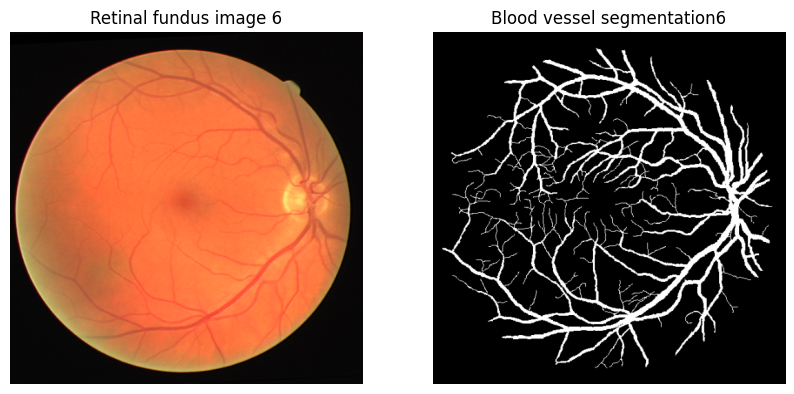

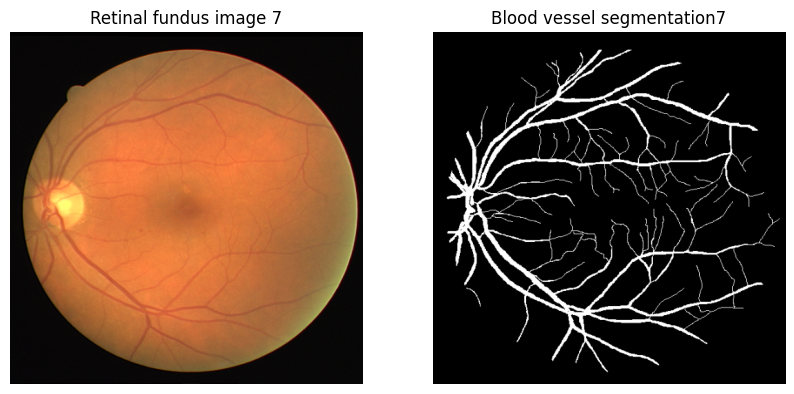

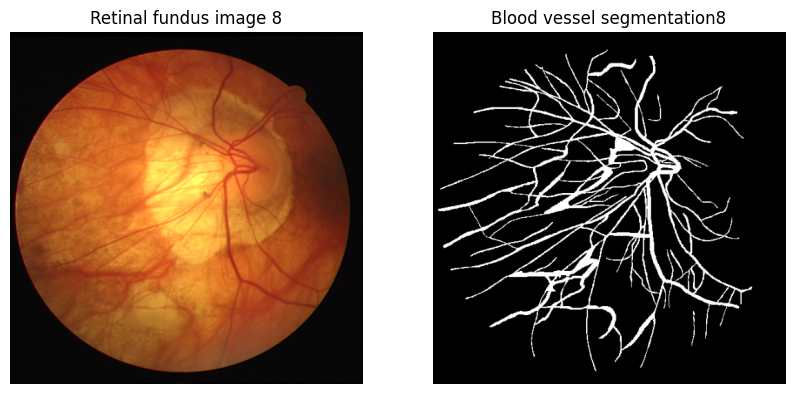

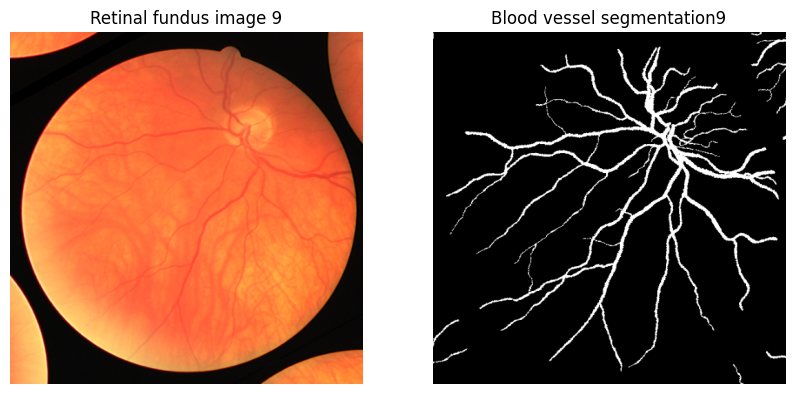

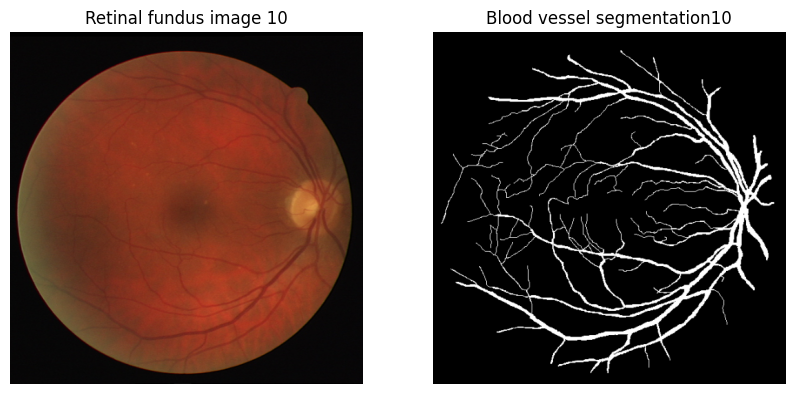

In [ ]:
plot_couples ( train_images , train_masks)

In [ ]:
image_mask_shape = train_images[0].shape
image_mask_shape

(512, 512, 3)

In [ ]:
def define_encoder_block(layer_in , n_filters , batchnorm = True ) :
  init = RandomNormal(stddev = 0.02)
  g = Conv2D(n_filters, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(layer_in)
  if batchnorm == True :
      g = BatchNormalization()(g, training=True)
  g = LeakyReLU (alpha = 0.2)(g)
  return g

def decoder_block (layer_in , skip_in , n_filters , dropout = False ) :
  init = RandomNormal(stddev = 0.02)
  g = Conv2DTranspose(n_filters, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(layer_in)
  g = BatchNormalization()(g, training=True)
  if dropout:
		  g = Dropout(0.5)(g, training=True)
  g = Concatenate()([g, skip_in])
  g = Activation('relu')(g)
  return g

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer RandomNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


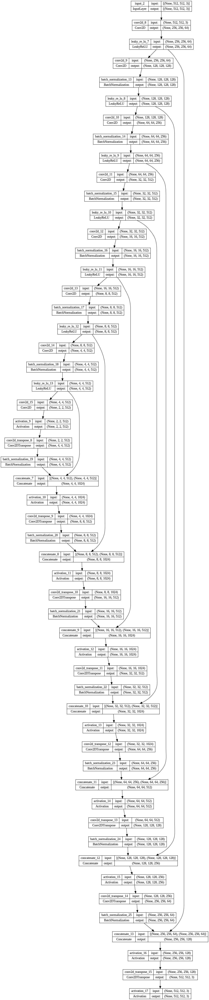

In [ ]:
def define_generator(image_shape=(512, 512, 3)):
	# weight initialization
	init = RandomNormal(stddev=0.02)
	# image input
	in_image = Input(shape=image_shape)
	# encoder model: C64-C128-C256-C512-C512-C512-C512-C512
	e1 = define_encoder_block(in_image, 64, batchnorm=False)
	e2 = define_encoder_block(e1, 128)
	e3 = define_encoder_block(e2, 256)
	e4 = define_encoder_block(e3, 512)
	e5 = define_encoder_block(e4, 512)
	e6 = define_encoder_block(e5, 512)
	e7 = define_encoder_block(e6, 512)
	# bottleneck, no batch norm and relu
	b = Conv2D(512, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(e7)
	b = Activation('relu')(b)
	# decoder model: CD512-CD512-CD512-C512-C256-C128-C64
	d1 = decoder_block(b, e7, 512)
	d2 = decoder_block(d1, e6, 512)
	d3 = decoder_block(d2, e5, 512)
	d4 = decoder_block(d3, e4, 512, dropout=False)
	d5 = decoder_block(d4, e3, 256, dropout=False)
	d6 = decoder_block(d5, e2, 128, dropout=False)
	d7 = decoder_block(d6, e1, 64, dropout=False)
	# output
	g = Conv2DTranspose(image_shape[2], (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d7) #Modified
	out_image = Activation('tanh')(g)  #Generates images in the range -1 to 1. So change inputs also to -1 to 1
	# define model
	model = Model(in_image, out_image)
	return model

U_NET = define_generator(image_mask_shape)
plot_model(U_NET, to_file='gen_model.png', show_shapes=True)

In [ ]:
U_NET.compile(optimizer='adam', loss='MSE', metrics=['accuracy'])

U_NET.fit(
    x=train_images,
    y=train_masks,
    batch_size=32,
    epochs=100,
    verbose='auto',

    initial_epoch=0,
    steps_per_epoch=1,
    use_multiprocessing=True
)

Epoch 1/100
1/1 [==============================] - 12s 12s/step - loss: 0.1143 - accuracy: 0.4595
Epoch 2/100
1/1 [==============================] - 2s 2s/step - loss: 0.1050 - accuracy: 0.2938
Epoch 3/100
1/1 [==============================] - 1s 848ms/step - loss: 0.0794 - accuracy: 0.1471
Epoch 4/100
1/1 [==============================] - 2s 2s/step - loss: 0.0765 - accuracy: 0.1414
Epoch 5/100
1/1 [==============================] - 2s 2s/step - loss: 0.0714 - accuracy: 0.2178
Epoch 6/100
1/1 [==============================] - 1s 848ms/step - loss: 0.0680 - accuracy: 0.3985
Epoch 7/100
1/1 [==============================] - 2s 2s/step - loss: 0.0681 - accuracy: 0.5659
Epoch 8/100
1/1 [==============================] - 2s 2s/step - loss: 0.0682 - accuracy: 0.6127
Epoch 9/100
1/1 [==============================] - 1s 853ms/step - loss: 0.0692 - accuracy: 0.5699
Epoch 10/100
1/1 [==============================] - 2s 2s/step - loss: 0.0691 - accuracy: 0.4219
Epoch 11/100
1/1 [==========

In [ ]:
U_NET.save("gen_e_"+ str(100) +".h5")


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
evaluation = U_NET.predict_on_batch(test_images)

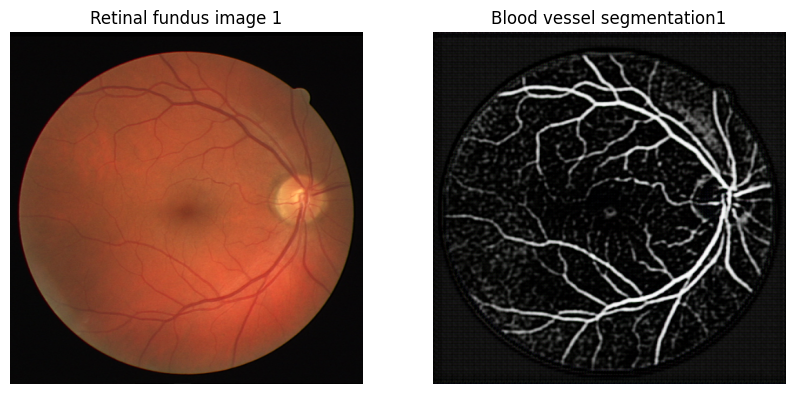

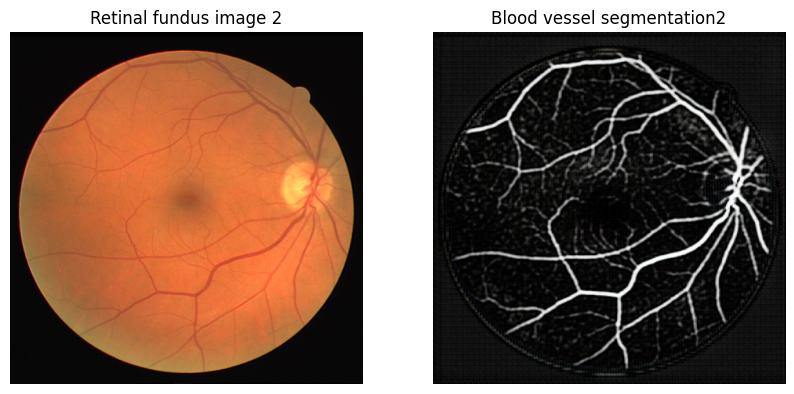

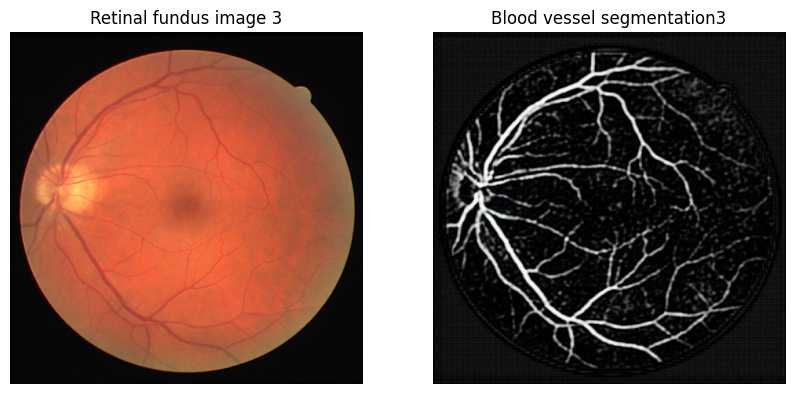

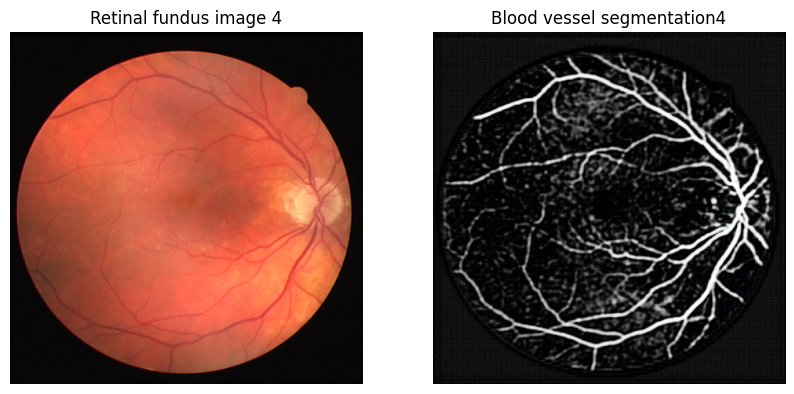

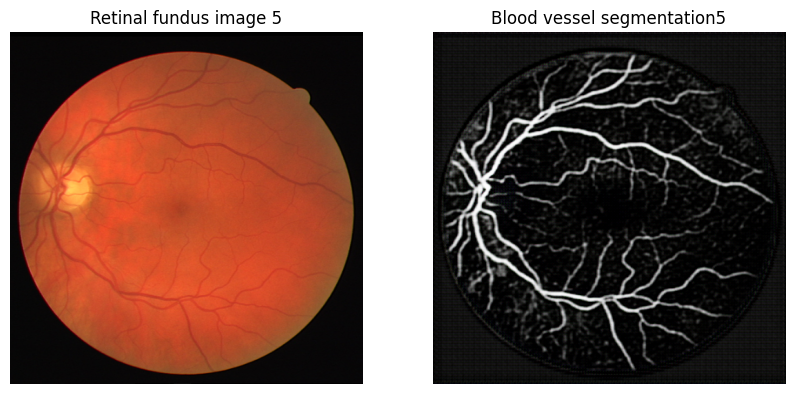

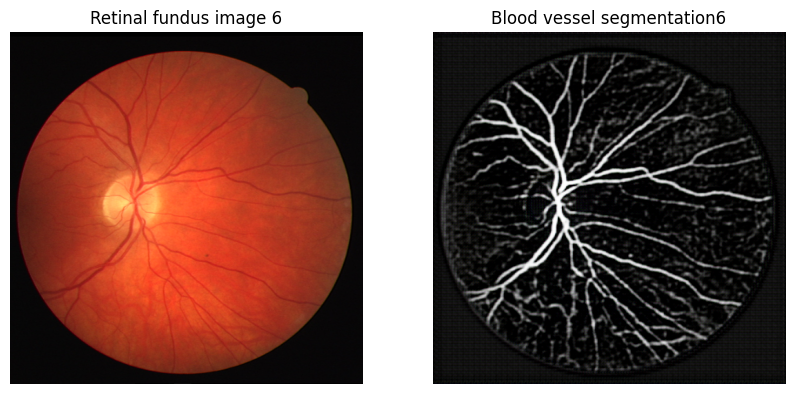

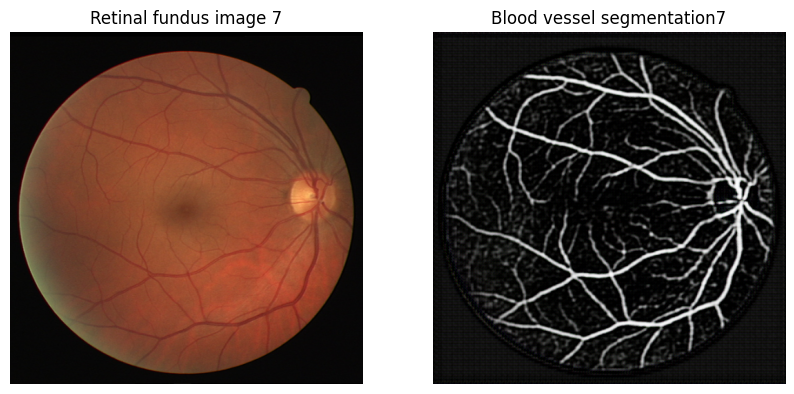

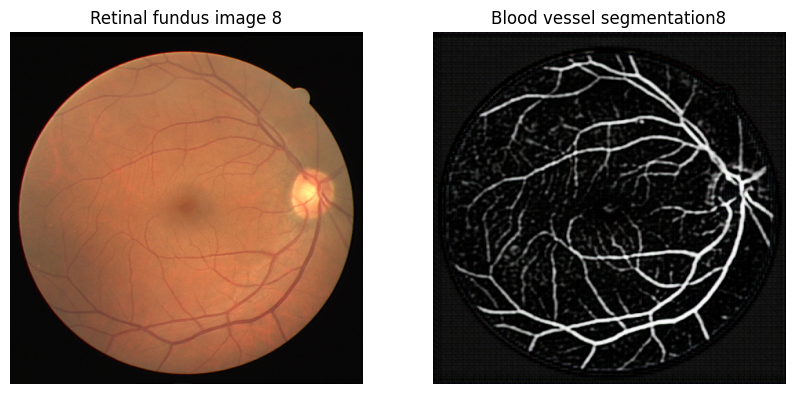

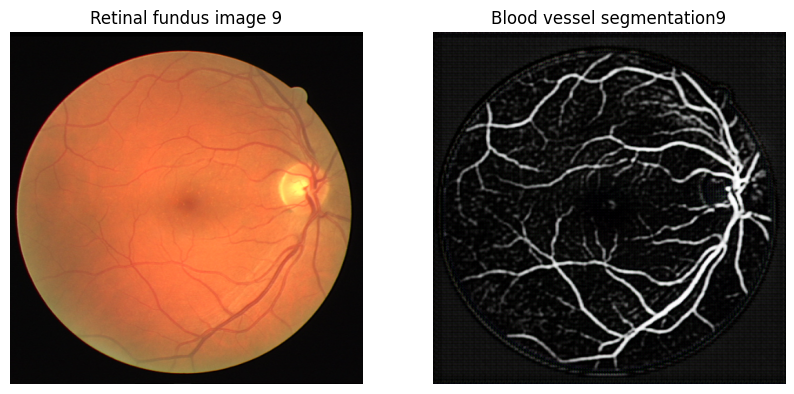

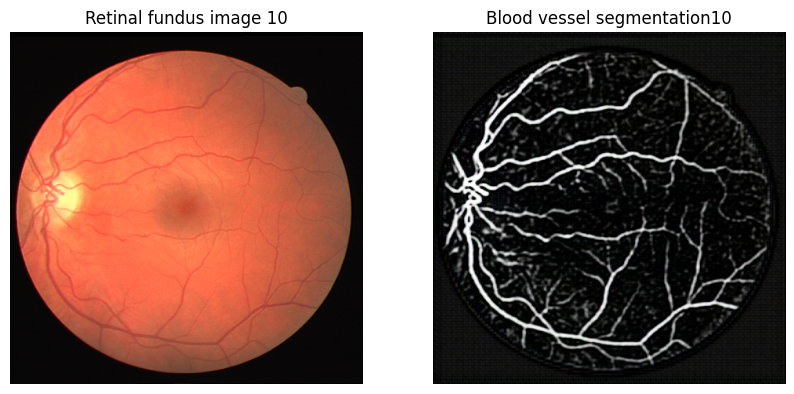

In [ ]:
plot_couples(test_images , evaluation)